## 노드12 : ControlNet으로 조건을 준 이미지 생성하기

**ControlNet이란?**  
Stable Diffusion은 텍스트 프롬프트 또는 입력 이미지를 통하여 이미지를 생성하지만 생성된 이미지를 원하는 대로 출력하기 어렵습니다. 아무리 프롬프트를 자세하게 써도 생성되는 이미지가 내가 원하는 자세, 구도, 배경을 갖도록 하는 것은 거의 불가능하죠. ControlNet은 Diffusion 모델에 추가 조건을 추가하여 출력되는 이미지를 쉽게 제어할 수 있습니다. 뿐만 아니라 ControlNet은 훈련 데이터가 작아도 학습이 잘 되고 빠르다는 장점이 있어 개인용 기기에서 사용할 수 있다는 장점이 있습니다.

ControlNet은 논문 ['Adding Conditional Control to Text-to-Image Diffusion Models'](https://arxiv.org/abs/2302.05543)에서 소개되었고, 외곽선 감지(Canny Edge detection), 인체 자세 감지(Human pose), 낙서 지도(Scribble map), 시맨틱 세그멘테이션(Semantic segmentation) 등 다양한 전처리기(Preprocessor)를 Stable Diffusion 모델에 도입할 수 있습니다. 그래서 원하는 자세, 구도 등으로 이미지를 생성할 수 있습니다.

base code : https://huggingface.co/docs/diffusers/v0.17.1/en/api/pipelines/stable_diffusion/overview

In [ ]:
# Stable Diffusion 설치
!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
# 메모리 삭제
# torch.cuda.empty_cache()

#### 윤곽선 검출

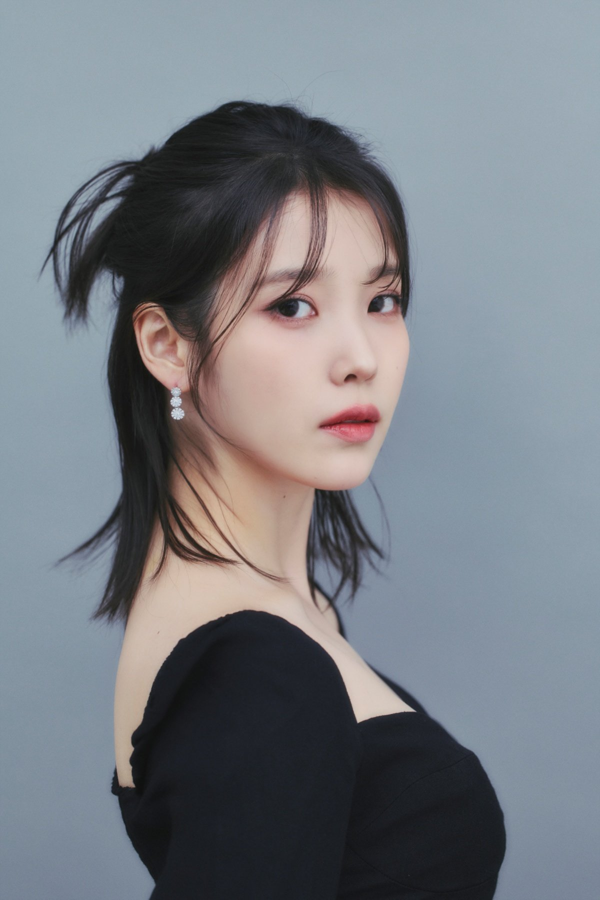

In [ ]:
import torch
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

# 이미지 불러오기
image = load_image(
    "https://dimg.donga.com/wps/NEWS/IMAGE/2023/10/06/121540802.2.jpg"
)
image = image.resize((600,900))
image

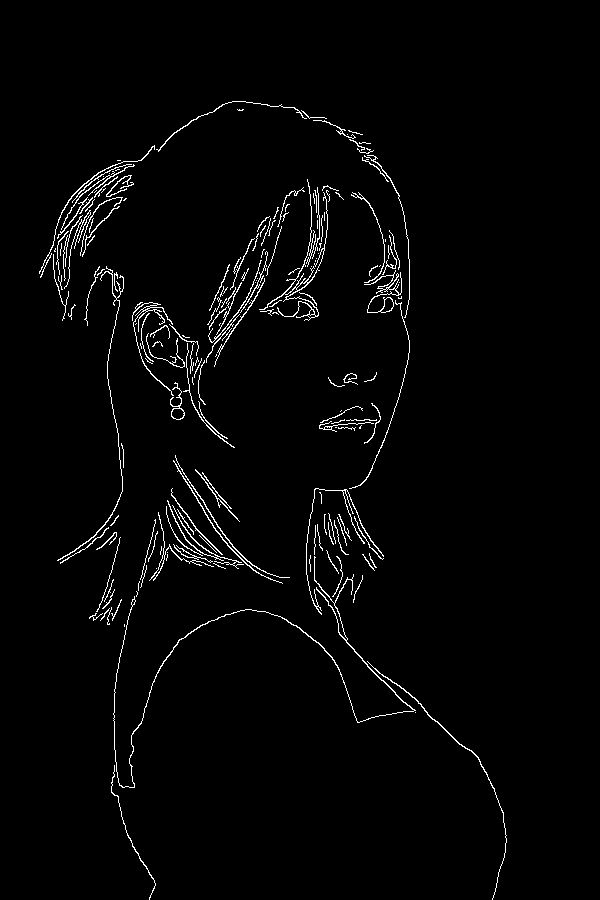

In [ ]:
import cv2
from PIL import Image
import numpy as np

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)

# threshold : calculates the gradient or intensity change between adjacent pixels
# low < < high 사이의 gradient를 출력해서 윤곽선 검출
low_threshold = 100
high_threshold = 200

# 윤곽선을 검출합니다.
image = cv2.Canny(image, low_threshold, high_threshold)
# 결과가 binary image with edges:marked with white(255), non-edges:marked with black(0)
# expanding the dimensions((H,W) -> (H,W,1))
image = image[:, :, None]
# axis 2의 이미지를 세개 concat해서 3-channel image 만들기
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)  # NumPy 배열을 PIL 이미지로 변환합니다.

canny_image

In [ ]:
# 윤곽선 검출 전처리기를 사용한 모델 파이프라인 불러오기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

canny_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
canny_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=canny_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
# 윤곽선을 추출한 이미지에 프롬프트를 적용하여 새로운 이미지 생성
from diffusers import UniPCMultistepScheduler
canny_pipe.scheduler = UniPCMultistepScheduler.from_config(canny_pipe.scheduler.config)
canny_pipe = canny_pipe.to("cuda")

# 동일한 이미지를 생성하기 위해 seed를 지정합니다.
generator = torch.manual_seed(0)

- height와 width (선택적) : 생성할 이미지의 높이와 너비를 지정합니다.
기본적으로 파이프라인은 512x512 픽셀로 이미지를 생성합니다. 원하는 크기에 맞춰 이 값을 변경할 수 있습니다.
- controlnet_conditioning_scale (선택적) : ControlNet 모델의 강도를 조절하는 파라미터입니다.
이 값을 조절하여 ControlNet의 영향력을 감소시키거나 증가시킬 수 있습니다. 일반적으로 1.0으로 설정되며, 이 값을 낮추면 ControlNet의 영향을 줄이고, 높이면 더 강한 영향을 미칠 수 있습니다.

- guidance_scale (선택적) : 텍스트 프롬프트의 영향을 얼마나 강하게 받을지를 결정하는 파라미터입니다.
일반적으로 7.5로 설정되며, 이 값을 높이면 프롬프트에 더 잘 맞는 이미지를 생성하지만, 너무 높으면 이미지가 왜곡될 수 있습니다.
- strength (선택적) : 이미지 변형 강도를 조절합니다.
0과 1 사이의 값을 가지며, 1에 가까울수록 이미지가 크게 변형되고, 0에 가까울수록 원본 이미지를 유지합니다.

  0%|          | 0/50 [00:00<?, ?it/s]

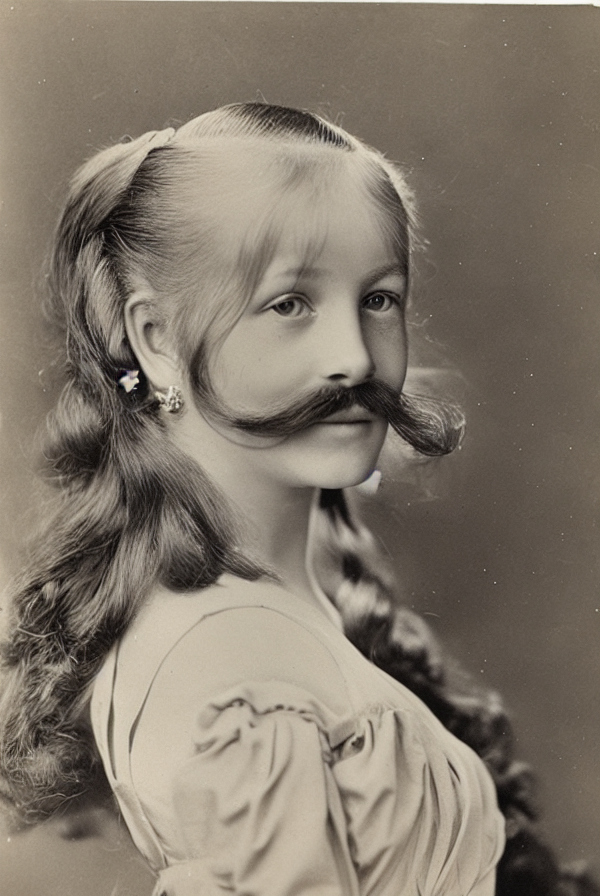

In [ ]:
# 이미지를 생성합니다.
gen_image = canny_pipe(
    prompt="a girl with a mustache",
    negative_prompt="blurry, low resolution, ugly, distorted, out of focus",
    generator=generator,
    image=canny_image,
    num_inference_steps=50,
    controlnet_conditioning_scale=0.5,
    guidance_scale = 10,
    strength = 0.75
).images[0]

# 생성된 이미지를 출력합니다.
gen_image

In [ ]:
# 생성된 이미지를 저장합니다.
gen_image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/iu_gen_image50_0.5_10_1.png")

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

# 경로 설정
image_dir = '/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations'

# 'iu'가 포함된 파일들을 필터링
image_files = [f for f in os.listdir(image_dir) if 'iu' in f.lower() and (f.endswith('.png') or f.endswith('.jpg') or f.endswith('.jpeg'))]

# 이미지 출력 설정
num_images = len(image_files)
cols = 3  # 한 줄에 출력할 이미지 수
rows = (num_images // cols) + int(num_images % cols != 0)  # 행의 수 계산

# 그리드로 이미지 출력
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

for i, file in enumerate(image_files):
    img_path = os.path.join(image_dir, file)
    img = mpimg.imread(img_path)

    ax = axes[i // cols, i % cols]
    ax.imshow(img)
    ax.set_title(file)
    ax.axis('off')  # 축 제거

# 빈 그리드에 대한 처리
for j in range(i + 1, rows * cols):
    axes[j // cols, j % cols].axis('off')

plt.tight_layout()
plt.show()


**조절가능한 하이퍼파라미터**  

- negative_propmt: 원하지 않는 요소를 적을 수 있습니다.
- controlnet_conditioning_scale: ContorlNet으로 조건을 어느 정도 주느냐를 조절합니다. Default는 1이고, 실수값으로 설정할 수 있습니다.
- num_inference_steps: 추론 횟수로, 값이 커질수록 고해상도 이미지가 출력되지만 출력되는 시간이 오래 걸립니다. default 값은 50입니다.
- guidance_scale: 얼마나 주어진 프롬프트에 근접한 이미지를 생성할지를 설정하는 하이퍼파라미터로, 값이 커질수록 문자열에 근접한 이미지가 생성되지만 이미지 품질이 떨어질 수 있습니다. default는 7.5입니다.

#### 인체 자세 감지

In [ ]:
# controlnet-aux를 설치합니다. Human pose를 검출해주는 controlnet의 보조용 모델입니다.
!pip install controlnet-aux==0.0.1

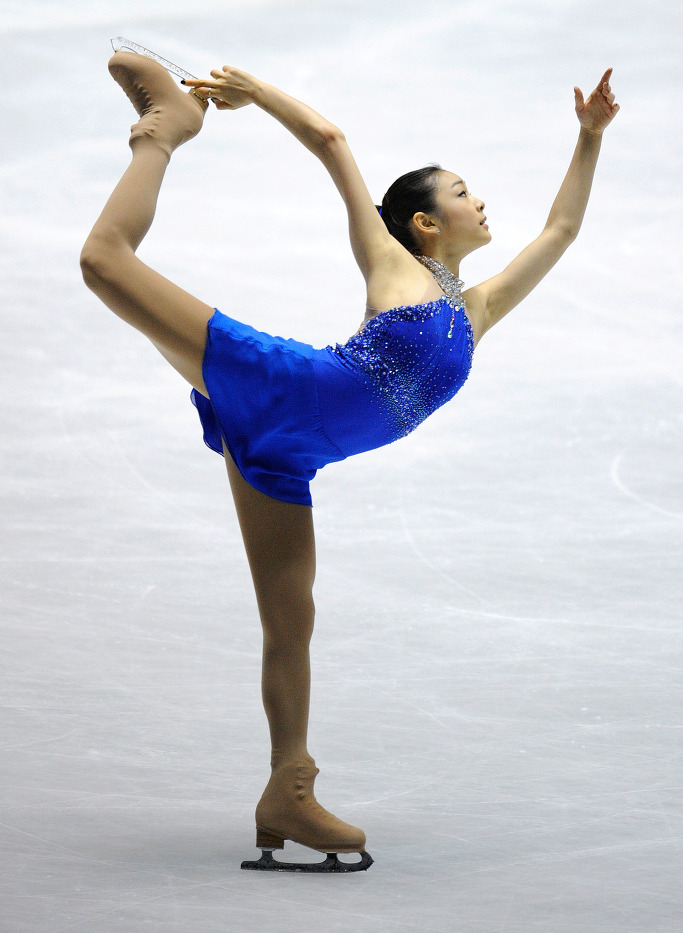

In [ ]:
from diffusers.utils import load_image

pose_image = load_image(
    "https://img1.daumcdn.net/thumb/R720x0.q80/?scode=mtistory2&fname=https%3A%2F%2Ft1.daumcdn.net%2Fcfile%2Ftistory%2F116B783B4FF1D5AC20"
)
pose_image

cuda


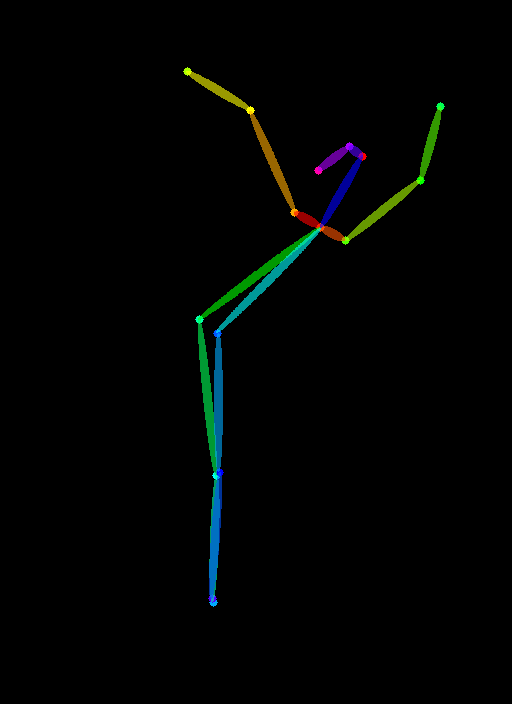

In [ ]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(pose_image)
openpose_image

어려운 포즈는 감지 못함

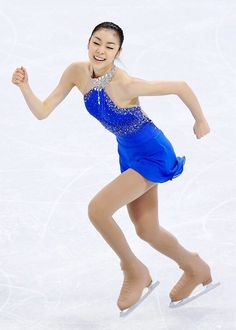

In [ ]:
from diffusers.utils import load_image

pose_image = load_image(
    "https://i.pinimg.com/236x/9e/8a/c3/9e8ac3bbeec68de28cb34e2c51fab4c8.jpg"
)
pose_image

cuda


/usr/local/lib/python3.10/dist-packages/controlnet_aux/open_pose/body.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_dict = util.transfer(self.model, torch.load(

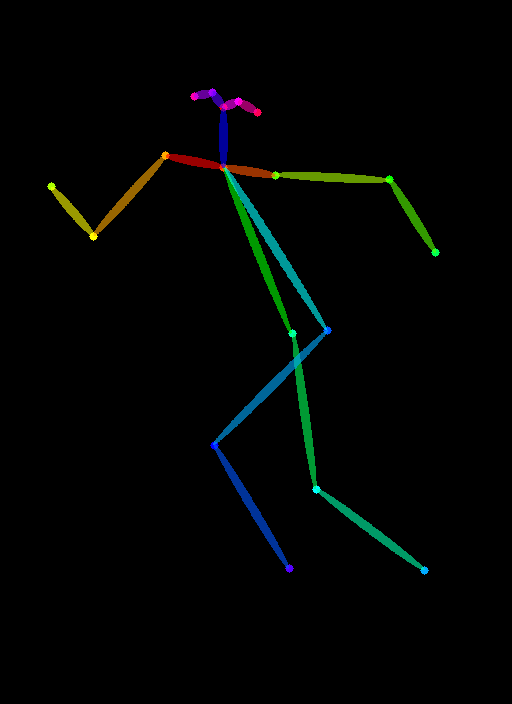

In [ ]:
from controlnet_aux import OpenposeDetector

# 인체의 자세를 검출하는 사전 학습된 ControlNet 불러오기
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

# 이미지에서 자세 검출
openpose_image = openpose(pose_image)
openpose_image

In [ ]:
# openpose 전처리기를 사용한 모델 파이프라인 불러오기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

openpose_controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-openpose", torch_dtype=torch.float16)
openpose_pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=openpose_controlnet, torch_dtype=torch.float16
)

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/20 [00:00<?, ?it/s]

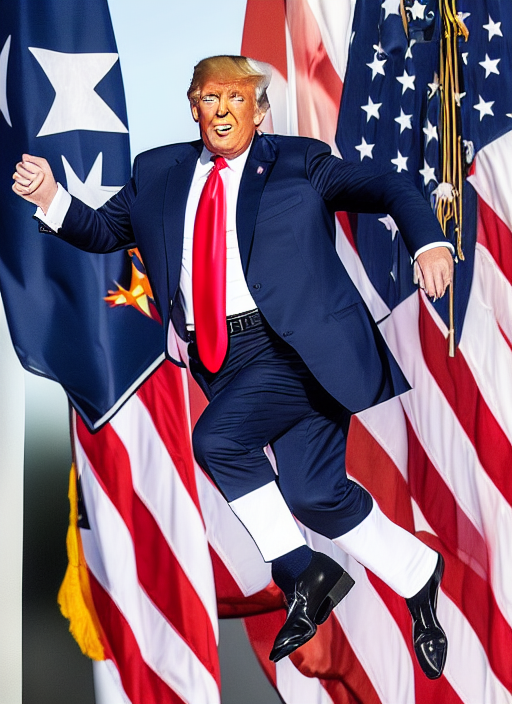

In [ ]:
from diffusers import UniPCMultistepScheduler

openpose_pipe.scheduler = UniPCMultistepScheduler.from_config(openpose_pipe.scheduler.config)
openpose_pipe = openpose_pipe.to("cuda")

# Q. 코드를 작성해 보세요.
# 동일한 이미지를 생성하기 위해 seed를 넣어줍니다.
generator = torch.manual_seed(0)

#프롬프트를 작성합니다.
prompt =  'Donald Trump wearing an austronaut suit in the universe'
negative_prompt =  'blurry, low resolution, ugly, distorted, out of focus'

images = openpose_image

# 이미지를 생성합니다.
openpose_image1 = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 출력합니다.
openpose_image1

In [ ]:
# 생성된 이미지를 저장합니다.
openpose_image1.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/openpose_image5.png")

#### 윤곽선 검출 + 인체자세감지 둘 다 사용하기

2개의 전처리기를 controlnets라는 리스트로 만들어 파이프라인으로 전달

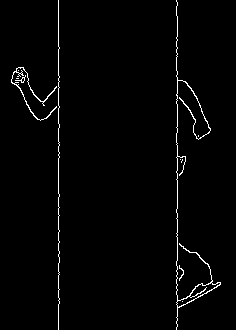

In [ ]:
# Canny 알고리즘을 사용한 윤곽선 검출
from diffusers.utils import load_image
from PIL import Image
import cv2
import numpy as np
from diffusers.utils import load_image

# Q. 코드를 작성해 보세요.
# 이미지를 불러오세요.
image = load_image('https://i.pinimg.com/236x/9e/8a/c3/9e8ac3bbeec68de28cb34e2c51fab4c8.jpg')

#threshhold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)

# 인체 감지 포즈를 넣어줄 가운데 부분을 지워줍니다.
zero_start = image.shape[1] // 4
zero_end = zero_start + image.shape[1] // 2
image[:, zero_start:zero_end] = 0

# 윤곽선을 검출하고 NumPy 배열을 PIL 이미지로 변환합니다.
canny_image = cv2.Canny(image, low_threshold, high_threshold)
canny_image = canny_image[:,:,None]
canny_image = np.concatenate([canny_image,canny_image,canny_image],axis=2)
canny_image = Image.fromarray(canny_image)

canny_image


cuda


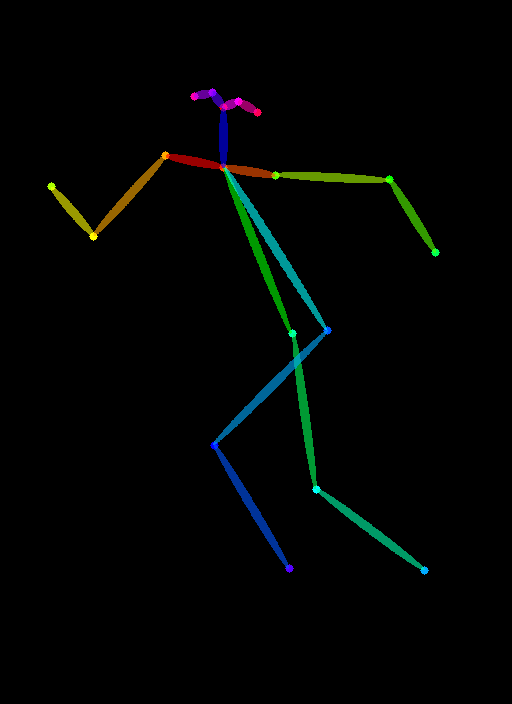

In [ ]:
# Openpose를 사용한 인체 자세 검출
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

# Q. 아래의 코드를 작성해 주세요.
# 이미지를 불러옵니다.
image = load_image('https://i.pinimg.com/236x/9e/8a/c3/9e8ac3bbeec68de28cb34e2c51fab4c8.jpg')
# OpenposeDetector를 사용하여 인체 자세를 검출합니다.
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(image)
openpose_image

  0%|          | 0/20 [00:00<?, ?it/s]

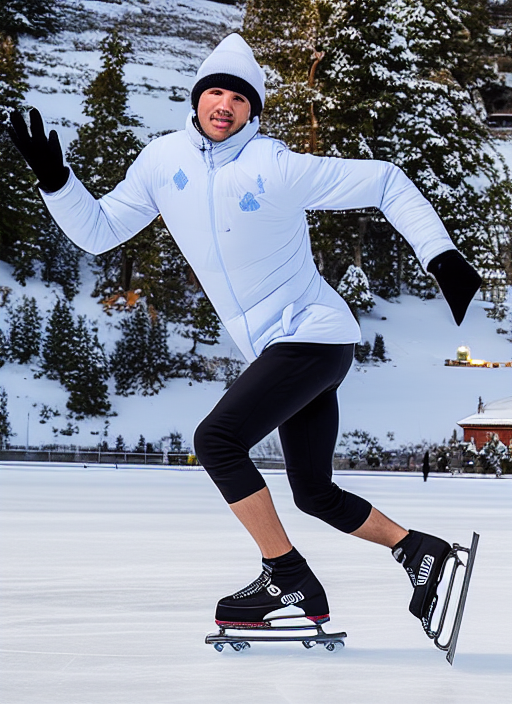

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['a man is skating at the frozen lake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet1_1.png")

# 생성된 이미지를 출력합니다.
image

  0%|          | 0/20 [00:00<?, ?it/s]

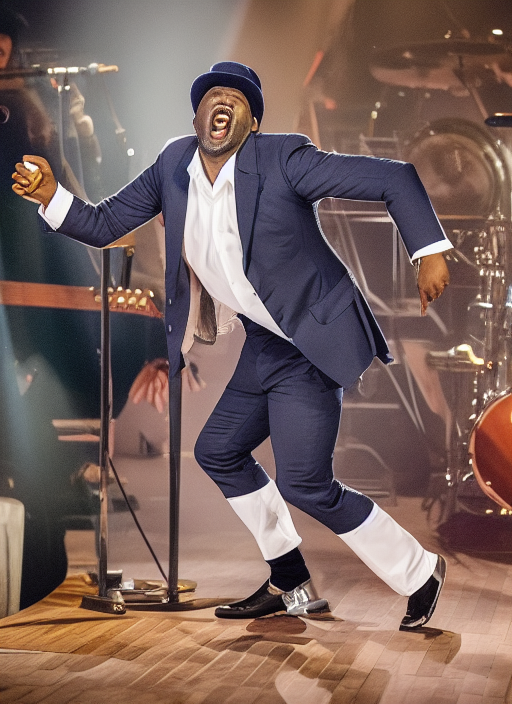

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['a man is singing on the stage','a man is singing on the stage']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet1_2.png")

# 생성된 이미지를 출력합니다.
image

  0%|          | 0/20 [00:00<?, ?it/s]

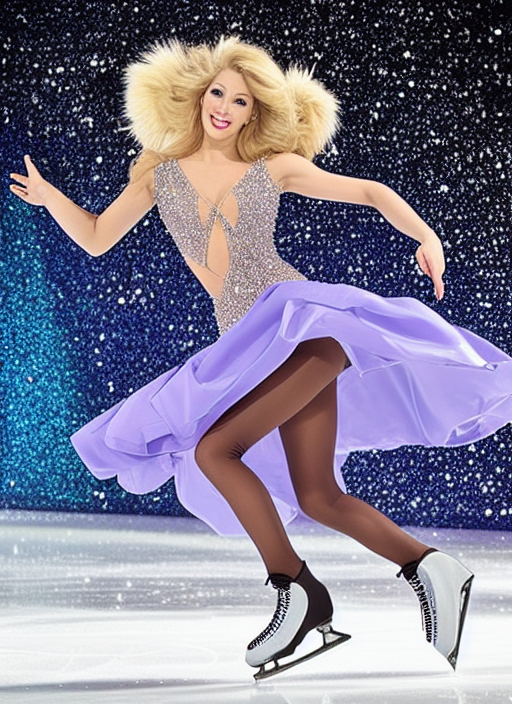

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['a beautiful lady is figure skating in the ice rink','a beautiful lady is figure skating in the ice rink']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet1_3.png")

# 생성된 이미지를 출력합니다.
image

#### 윤곽선 검출 + 인체자세감지 둘 다 사용하기2 : 윤곽선 검출은 배경사진으로 설정

2개의 전처리기를 controlnets라는 리스트로 만들어 파이프라인으로 전달

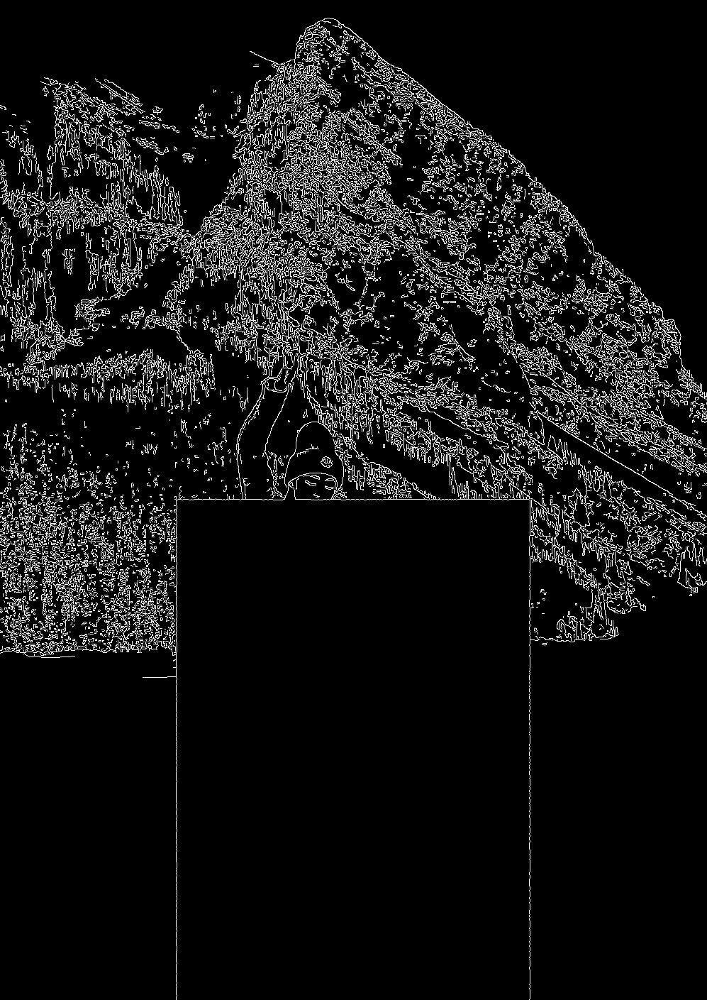

In [ ]:
# Canny 알고리즘을 사용한 윤곽선 검출
from diffusers.utils import load_image
from PIL import Image
import cv2
import numpy as np
from diffusers.utils import load_image

# Q. 코드를 작성해 보세요.
# 이미지를 불러오세요.
image = load_image('https://www.natgeotraveler.co.kr/uploads/boards/2023/05/14334914dcbc2647c72a6aeb987b38dd.jpg')

#threshhold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)
canny_image = image

# 가로 방향으로 가운데 부분을 지우는 코드
zero_start = canny_image.shape[1] // 4
zero_end = zero_start + canny_image.shape[1] // 2
vertical_zero_start = canny_image.shape[0] // 2
canny_image[vertical_zero_start:, zero_start:zero_end] = 0

# 윤곽선을 검출하고 NumPy 배열을 PIL 이미지로 변환합니다._
canny_image = cv2.Canny(canny_image, low_threshold, high_threshold)
canny_image = canny_image[:,:,None]
canny_image = np.concatenate([canny_image,canny_image,canny_image],axis=2)
canny_image = Image.fromarray(canny_image)

canny_image


cuda


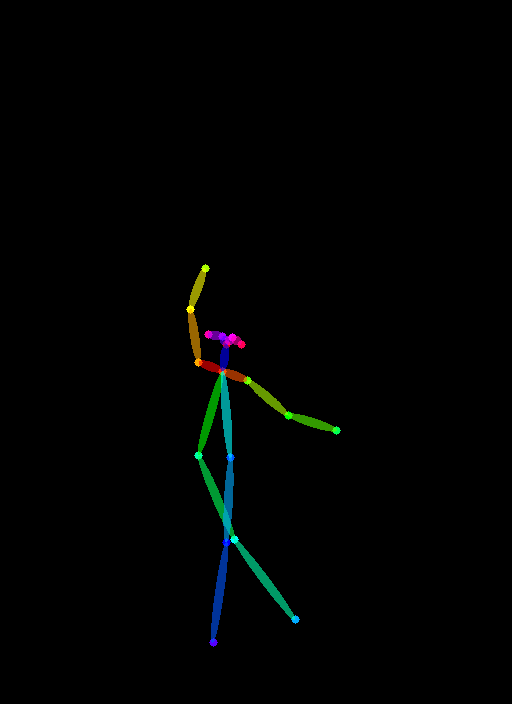

In [ ]:
# Openpose를 사용한 인체 자세 검출
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

# Q. 아래의 코드를 작성해 주세요.
# 이미지를 불러옵니다.
image = load_image('https://www.natgeotraveler.co.kr/uploads/boards/2023/05/14334914dcbc2647c72a6aeb987b38dd.jpg')
# OpenposeDetector를 사용하여 인체 자세를 검출합니다.
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(image)
openpose_image

  0%|          | 0/20 [00:00<?, ?it/s]

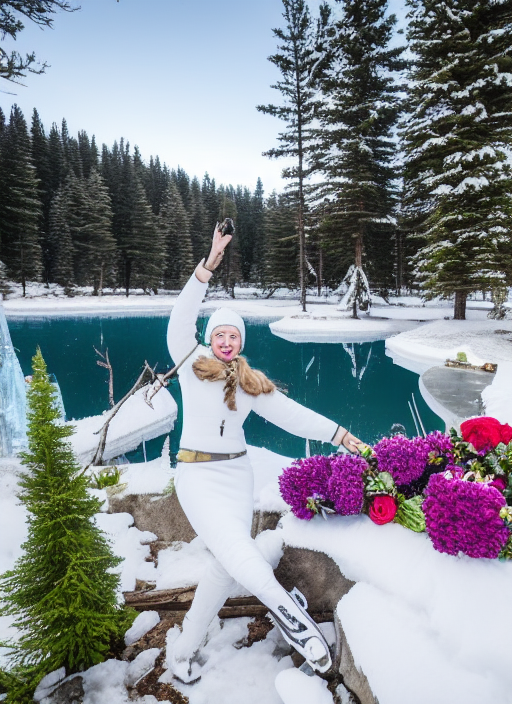

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['frozen lake with bunch of flowers outside of lake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet3_1.png")

# 생성된 이미지를 출력합니다.
image

  0%|          | 0/20 [00:00<?, ?it/s]

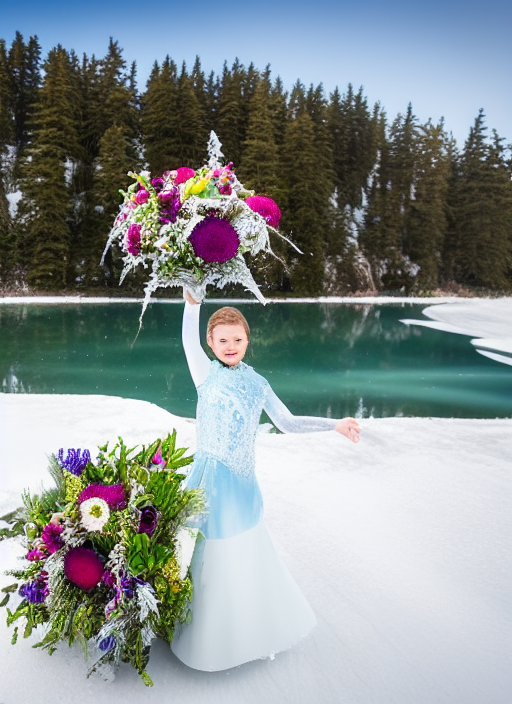

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['frozen lake with bunch of flowers outside of lake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(20)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet3_1.png")

# 생성된 이미지를 출력합니다.
image

  0%|          | 0/20 [00:00<?, ?it/s]

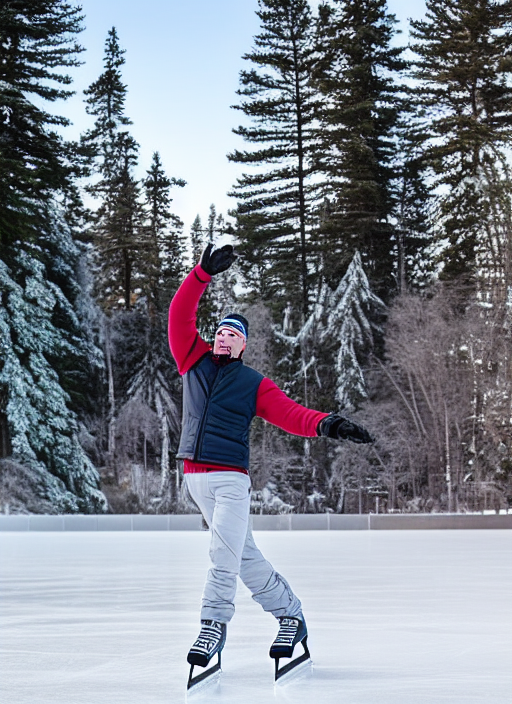

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler


# 프롬프트를 작성합니다.
prompt =  ['a man is skating at the frozen lake','the frozen Louis Lake in canada']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet3_2.png")

# 생성된 이미지를 출력합니다.
image

#### 윤곽선 검출 + 인체자세감지 둘 다 사용하기3 : 파라미터 변경

2개의 전처리기를 controlnets라는 리스트로 만들어 파이프라인으로 전달

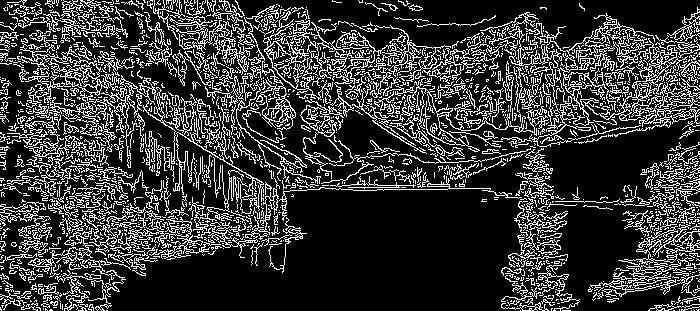

In [ ]:
# Canny 알고리즘을 사용한 윤곽선 검출
from diffusers.utils import load_image
from PIL import Image
import cv2
import numpy as np
from diffusers.utils import load_image

# Q. 코드를 작성해 보세요.
# 이미지를 불러오세요.
image = load_image('https://pimg.mk.co.kr/news/cms/202306/26/news-p.v1.20230626.069597e937644367b91795f913ffbebc_P1.jpg')

#threshhold를 지정합니다.
low_threshold = 100
high_threshold = 200

# 이미지를 NumPy 배열로 변환합니다.
image = np.array(image)
canny_image = image.copy()

# # 가로 방향으로 가운데 부분을 지우는 코드
# zero_start = canny_image.shape[1] // 4
# zero_end = zero_start + canny_image.shape[1] // 2
# vertical_zero_start = canny_image.shape[0] // 2
# canny_image[vertical_zero_start:, zero_start:zero_end] = 0

# 윤곽선을 검출하고 NumPy 배열을 PIL 이미지로 변환합니다._
canny_image = cv2.Canny(canny_image, low_threshold, high_threshold)
canny_image = canny_image[:,:,None]
canny_image = np.concatenate([canny_image,canny_image,canny_image],axis=2)
canny_image = Image.fromarray(canny_image)

canny_image


cuda


/usr/local/lib/python3.10/dist-packages/controlnet_aux/open_pose/body.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_dict = util.transfer(self.model, torch.load(

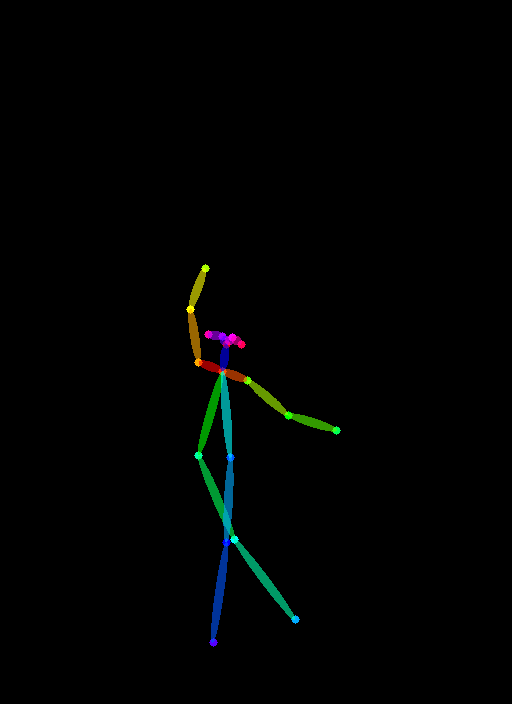

In [ ]:
# Openpose를 사용한 인체 자세 검출
from controlnet_aux import OpenposeDetector
from diffusers.utils import load_image

# Q. 아래의 코드를 작성해 주세요.
# 이미지를 불러옵니다.
image = load_image('https://www.natgeotraveler.co.kr/uploads/boards/2023/05/14334914dcbc2647c72a6aeb987b38dd.jpg')
# OpenposeDetector를 사용하여 인체 자세를 검출합니다.
openpose = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
openpose_image = openpose(image)
openpose_image

  0%|          | 0/20 [00:00<?, ?it/s]

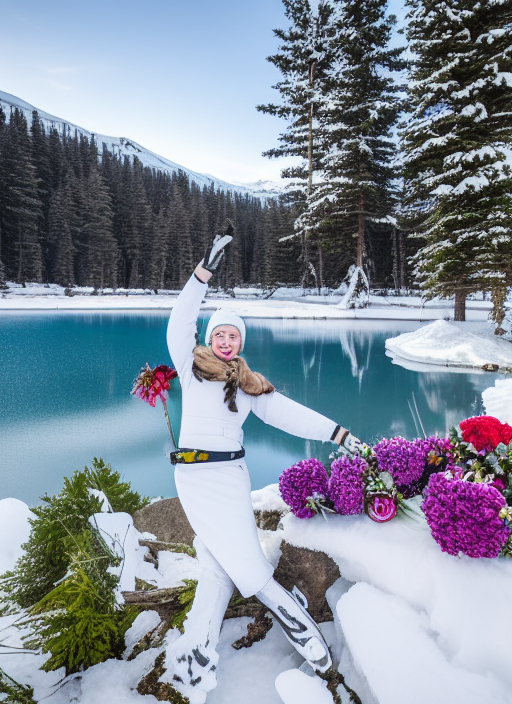

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['frozen lake with bunch of flowers around thelake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=20, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet2_1.png")

# 생성된 이미지를 출력합니다.
image

  0%|          | 0/50 [00:00<?, ?it/s]

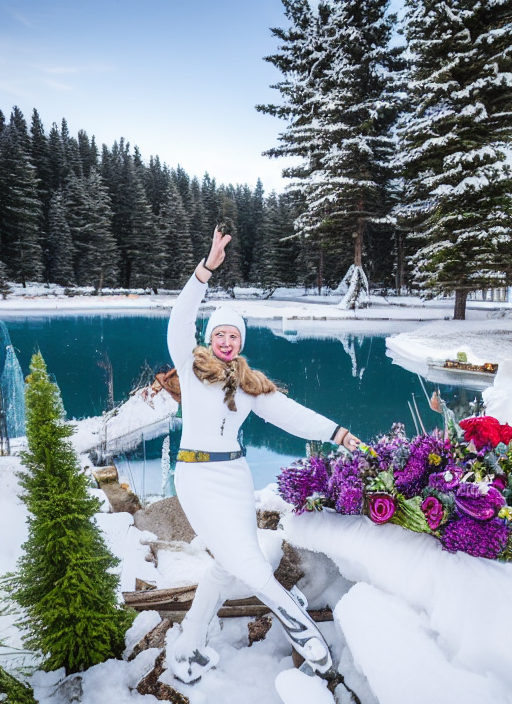

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['frozen lake with bunch of flowers around the lake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=50, image=images).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet2_2.png")

# 생성된 이미지를 출력합니다.
image

##### 하이퍼파라미터 변경

- height와 width (선택적) : 생성할 이미지의 높이와 너비를 지정합니다.
기본적으로 파이프라인은 512x512 픽셀로 이미지를 생성합니다. 원하는 크기에 맞춰 이 값을 변경할 수 있습니다.
- controlnet_conditioning_scale (선택적) : ControlNet 모델의 강도를 조절하는 파라미터입니다.
이 값을 조절하여 ControlNet의 영향력을 감소시키거나 증가시킬 수 있습니다. 일반적으로 1.0으로 설정되며, 이 값을 낮추면 ControlNet의 영향을 줄이고, 높이면 더 강한 영향을 미칠 수 있습니다.

- guidance_scale (선택적) : 텍스트 프롬프트의 영향을 얼마나 강하게 받을지를 결정하는 파라미터입니다.
일반적으로 7.5로 설정되며, 이 값을 높이면 프롬프트에 더 잘 맞는 이미지를 생성하지만, 너무 높으면 이미지가 왜곡될 수 있습니다.
- strength (선택적) : 이미지 변형 강도를 조절합니다.
0과 1 사이의 값을 가지며, 1에 가까울수록 이미지가 크게 변형되고, 0에 가까울수록 원본 이미지를 유지합니다.

  0%|          | 0/50 [00:00<?, ?it/s]

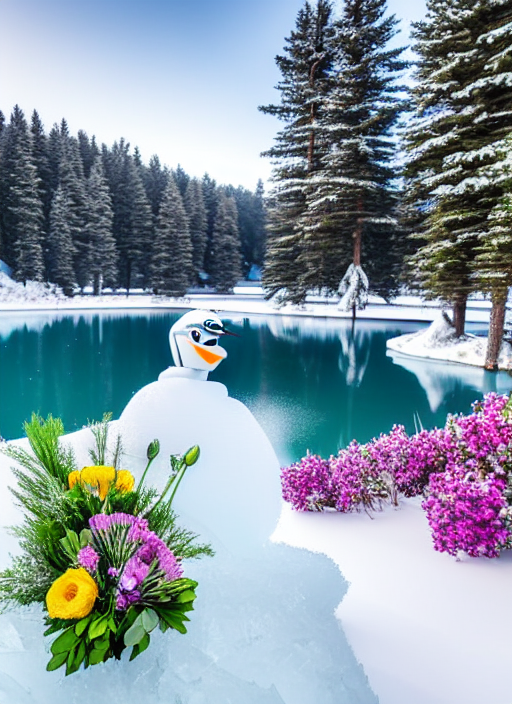

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['frozen lake with bunch of flowers around the lake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=50, image=images, controlnet_conditioning_scale=0.5,guidance_scale = 15,strength = 0.5).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet2_3.png")

# 생성된 이미지를 출력합니다.
image

  0%|          | 0/50 [00:00<?, ?it/s]

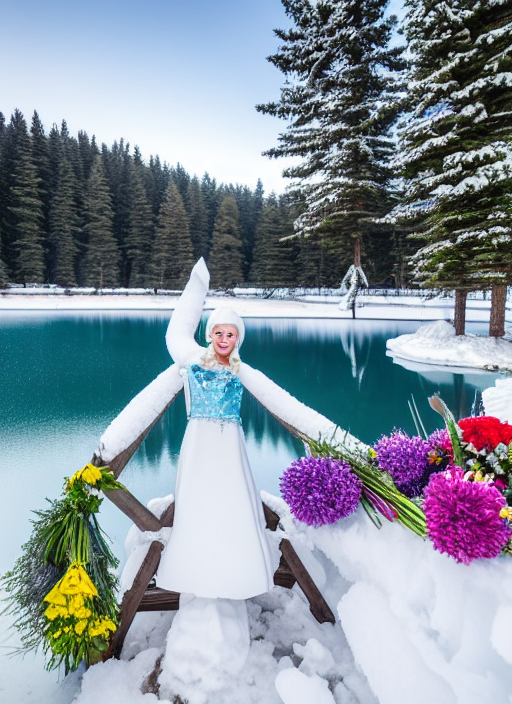

In [ ]:
# 두개 합치기
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

# 프롬프트를 작성합니다.
prompt =  ['frozen lake with bunch of flowers around the lake','a man is skating at the frozen lake']
negative_prompt = ['blurry, low resolution, ugly, distorted, out of focus, erase letter','blurry, low resolution, ugly, distorted, out of focus, erase letter']

# seed를 지정합니다.
generator = generator = torch.manual_seed(0)

images = [openpose_image, canny_image]

# 이미지를 생성합니다.
image = openpose_pipe(prompt=prompt, negative_prompt=negative_prompt, num_inference_steps=50, image=images, controlnet_conditioning_scale=0.75,guidance_scale = 10,strength = 0.5).images[0]

# 생성된 이미지를 저장합니다.
image.save("/content/drive/MyDrive/Aiffel/Exploration_node/5_StableDiffusion/creations/controlnet2_4.png")

# 생성된 이미지를 출력합니다.
image